# Computing values and significance for multirun ensembles

Burrell et al., (2018) showed that using multiple TSS-RESTREND runs using different dataset allows for the better quantification of errors.  Burrell et al., (2020) expanded on this by methods to address the issues of multiple testing and spatial autocorrelation. For more details on these issues see [Wilks 2016](https://doi.org/10.1175/BAMS-D-15-00267.1). To resolve this issue Burrell et al., (2020) used two separate ensemble significance tests. The first method combines the per pixel p-values using the Fisher’s method, then determines which pixels are significant using the Benjamini–Hochberg procedure which controls the False Discovery Rate (FDR). In simple terms FDR correction methods control tje proportion of "discoveries" (significant results) that are actually false positives. The second approach is based on the IPCC criteria for ensemble significance and agreement.  These criteria require that, for a given pixel, more than 50% runs in an ensemble have a significant result, with more than 80% of the significant members agreeing on the direction of the change.  A pixel must pass both the P-value FDR and the IPCC ensemble significance test to be considered significant by Burrell et al., (2020).

A demonstration dataset contain the results of 12 runs estimating for one variable and the associated p values.  This approach is applied to all the variables produced by ../ but providing that much test data exceeds GitHub’s file-size limits.  To make this approach computationally efficient and modular, the code below is designed to leverages two powerful functions from the xarray python library, 
1.	[apply_ufunc]( http://xarray.pydata.org/en/stable/generated/xarray.apply_ufunc.html) which allows custom function to be rapidly mapped over multi-dimensional datasets.    
2.	dataset [copy]( http://xarray.pydata.org/en/stable/generated/xarray.Dataset.copy.html) function which has the argument data which can be used to create a new dataset with the same metadata and attributes but replace the data with new values.  

Both functions can be made to run in parallel using [xarray’s dask chunking]( https://xarray.pydata.org/en/v0.16.0/dask.html).  


## import the packages and load the dataset



In [2]:
# ========== Import some usefull packages ============
import os
import sys
import numpy as np
import pandas as pd
import xarray as xr
import bottleneck as bn
from scipy import stats
import matplotlib.pyplot as plt
import statsmodels.stats.multitest as smsM
import cartopy.crs as ccrs

# ========== Read in test ensemble ==========
# The ensemble result for one TSSRattribution category
ds_ens = xr.open_dataset("./data/AUS_TSSRattribution_ensemble_example.nc")

# ========== Set the name of the var and the pvalue var ==========
var  = "ClimateChange" 
pvar = "ClimateChange.Pvalue"

# ===== print out the datasets =====
print(ds_ens)

# ========== Pull out the var and the pvalues inte xarray datarray format ==========
raw_cv = ds_ens[var]
raw_pv = ds_ens[pvar]
# In building the dataset, pvalues were rounded to zero to save space. However, pvalues  
# of 0 break some stats functions, So its nessary to replace them with a small float
raw_pv = raw_pv.where(raw_pv != 0, 0.0000001) 



<xarray.Dataset>
Dimensions:               (latitude: 138, longitude: 176, run: 12, time: 1)
Coordinates:
  * latitude              (latitude) float64 -10.13 -10.38 ... -44.15 -44.4
  * longitude             (longitude) float64 112.2 112.4 112.7 ... 155.7 155.9
  * time                  (time) datetime64[ns] 2015-12-31
  * run                   (run) int64 0 1 2 3 4 5 6 7 8 9 10 11
Data variables:
    ClimateChange         (time, latitude, longitude, run) float64 ...
    ClimateChange.Pvalue  (time, latitude, longitude, run) float64 ...
Attributes:
    title:          Multi-Run TSS-RESTREND Ensemble Results
    summary:        Multi-Run TSS-RESTREND Ensemble Dataset created using Dat...
    Conventions:    CF-1.7
    history:        2020-07-29 11:42:46.149475: Netcdf file created using Dat...
    creator_name:   Arden Burrell
    creator_url:    ardenburrell.com
    creator_email:  arden.burrell@gmail.com
    institution:    WHRC
    date_created:   2020-07-29 11:42:46.149535
    refer

## Calculate the ensemble mean 

Before determing signicance, we need to calculate the mean of the observed values. This is easily done with xarray.  

In [ ]:
# ========== Calculate the ensembe mean ==========
ensmean = raw_cv.mean(dim="run")
ensmean.plot()
plt.show()



## Ensemble p-value significance
The first of the two significance tests is the combine pvalue signifance test. At each pixel, the pvalues are combined using the scipy stats combine_pvalues function and then a FDR method is used to correct for False Discovery rate. To do this in a way that leverages the power of xarray, the first step is to build an inner function that takes a 1d numpy array.  In this case we will let xarray handle vectorizing the function as its more readable and easier to debug in the event or errors. However, according to xarray documentation, there is the potential for significance performance gains by pre vectorising the function using numpy [vectorise](https://numpy.org/doc/stable/reference/generated/numpy.vectorize.html) or the even faster numba [vectorise](https://numba.pydata.org/numba-doc/latest/user/vectorize.html). Numba even supports GPU complation.  


In [3]:

def _combine_pvalue2d(pvals):
    """
    takes an array and removes nans then combines
    args:
        pvalues:    np.array
            the pvalues to be combined 
    return:
        
    """

    if bn.allnan(pvals):
        return np.NAN
    else:
        ___, pv = stats.combine_pvalues(pvals[~np.isnan(pvals)])
        return pv

### Create the FDR significane function.  

The second function needed to determine the ensemble p-value significance is one that performs the FDR correction. FDR methods like the Benjamini-Hochberg consider all the per-pixel p-values in aggrate and determine which meet the significance threshold.  

This FDR function takes a 3d array (lon, lat and 1d of time), and return an array of the same shape but with 1 indicating significant and 0 indicating not significant.  This function is used in both the Ensemble p-value annd IPCC significance checks.  


In [4]:
def FDRSignificanceCorrection(da, FDRmethod = "fdr_bh", alpha = 0.10):
    """
    Takes the results of an existing trend detection aproach and modifies them to
    account for multiple comparisons.  
    args
        da: 3d Numpy array. 
        	The time dime should have a size of 1
        FDRmethod: str
            The method to use for FDR
        alpha: float (9-1)
            Significance level
    returns:
        res: n-darray
            Same shape as da.  ! for significant, 0 for not significant. NaN for bad/no data
    
    """
    if FDRmethod == "fdr_by":
        t_method = "Adjusting for multiple comparisons using Benjamini/Yekutieli"
    elif FDRmethod == "fdr_bh":
        t_method = "Adjusting for multiple comparisons using Benjamini/Hochberg"
    else:
        raise ValueError("unknown MultipleComparisons method: %s, must be either fdr_by or fdr_bh " % FDRmethod)

    # ========== Work out the pvalue name =========== 
    shape = da.shape
    # ========== Locate the p values and reshape them into a 1d array ==========
    # ++++++++++ Find the pvalues ++++++++++
    ODimDa     = da.ravel()
    isnan      = np.isnan(ODimDa)
    
    # ++++++++++ pull out the non nan pvalus ++++++++++
    pvalue1d   = ODimDa[~isnan]
    
    # =========== Perform the MC correction ===========
    pvalue_adj = smsM.multipletests(pvalue1d, method=FDRmethod, alpha=alpha)
    # =========== Get the significance in bool ===========
    sigfloat   = pvalue_adj[0].astype(float)

    # make an empty dataarray
    re         = np.zeros_like(ODimDa)
    re[~isnan] = sigfloat
    re[isnan]  = np.NaN

    res = re.reshape(shape)
    # print(pvalue_adj[0], pvalue_adj[0].shape)
    return res

Now that the functions are ready, they can be appled to the pvalues that were pulled from the dataset above.  In the figure, 1=Sig, 0=Not SIg, nan=No Data.  



<xarray.DataArray 'ClimateChange.Pvalue' (time: 1, latitude: 138, longitude: 176)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * latitude   (latitude) float64 -10.13 -10.38 -10.63 ... -43.9 -44.15 -44.4
  * longitude  (longitude) float64 112.2 112.4 112.7 112.9 ... 155.4 155.7 155.9
  * time       (time) datetime64[ns] 2015-12-31


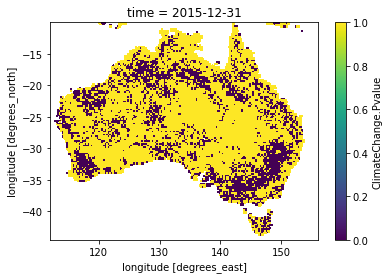

In [5]:
# ========== Take the 12 p-vaules at each pixel (one from each run) and work out the combined p-values ==========
pvals    = xr.apply_ufunc(_combine_pvalue2d, raw_pv, input_core_dims=[["run"]], vectorize=True)

# ========== Control for the FDR in thethe combined p-values ==========
FDRpvsig =  pvals.copy(data = FDRSignificanceCorrection(pvals.values))

print(FDRpvsig)
FDRpvsig.plot()
plt.show()

## IPCC Signifcance and agreement

The second test for significance is the IPCC signifcance and agreement test which uses the following rule.  For a pixel to to be significant, more than 50% of the ensemble members (runs) must be significant, and of those signifcant runs >80% must agree on the direction of the change.  To do this we will again leverage xarrays apply_ufunc. but his time we will take advantage of it ability take multiple datasets at once.  The IPCC function below takes two 1d arrays, the first is the observed change values that are used to determine change direction, and the second is an array of the same size where 1 is significant and 0 is not significant.  

In [6]:
def IPCC(direction, significance):
    """
    Function to caluculate the significance using ipcc criteria
    args:
        direction: npA
            the actual change values for a given pixel
        significance: npA
            FDR adjusted significance
    returns:
        ipcc_sig:   npA
            0 for not sig, 1 for sig
    """
    if bn.allnan(direction):
        return np.NaN
    else:
        totnum = bn.nansum((~np.isnan(direction)).astype(float))
        direc  = direction[~np.isnan(direction)]
        signi  = significance[~np.isnan(direction)]


        # Find the number of significant runs
        signum = np.sum(signi==1).astype(float)
        if signum == 0:
            # Remove the badly behaving zeros
            return 0

        # ========== IPCC significance testing ==========
        # +++++ 50% significant +++++
        sig50  = signum>=0.50
    
        # # +++++ 80% agreement +++++
        # agreement
        ag = [np.sum(np.logical_and((direc > 0), (signi == 1))), np.sum(np.logical_and((direc < 0), (signi == 1)))]
        agree = float(bn.nanmax(ag))

        agr80 = (agree/signum)>= 0.80
        return int(agr80)


To convert the pvaules ti bool numbers (1, 0) indicating we use pythons list comprehension to apply the FDRSignificanceCorrection function to each run within the ensemble and then using xarray's copy function to preserve the metadata and dimensions. Then we apply the IPCC function to that DataArray. 

<xarray.DataArray (time: 1, latitude: 138, longitude: 176)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * latitude   (latitude) float64 -10.13 -10.38 -10.63 ... -43.9 -44.15 -44.4
  * longitude  (longitude) float64 112.2 112.4 112.7 112.9 ... 155.4 155.7 155.9
  * time       (time) datetime64[ns] 2015-12-31


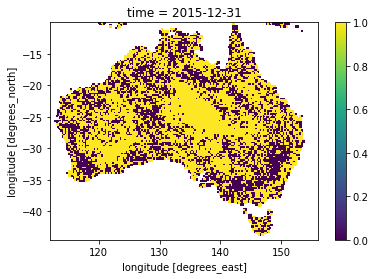

In [7]:
# ========== IPCC signifcance ==========
# +++++ Take the individual runes and calculate the FDR significane for each one +++++
fdr_ls = [FDRSignificanceCorrection(raw_pv.isel(run=rn).values) for rn in raw_pv.run]
# +++++ Using xarray's copy (data = ...), build a new FDR significance dataarray with the the same shape as raw_pv. +++++
FDRbool = raw_pv.copy(data=np.stack(fdr_ls, axis=-1))
# +++++ Apply the IPCC ensemble criteria to the dattarray +++++
IPCCsig  = xr.apply_ufunc(IPCC,raw_cv, FDRbool, input_core_dims=[["run"], ["run"]], vectorize=True)

print(IPCCsig)
IPCCsig.plot()
plt.show()

Finally, make a dataset that contains all the infomation and a map showing the masked values. For details on how to write this data to a new netcdf file see the example in [S03_MappingResults.py](./S03_MappingResults.py).  


<xarray.Dataset>
Dimensions:        (latitude: 138, longitude: 176, time: 1)
Coordinates:
  * latitude       (latitude) float64 -10.13 -10.38 -10.63 ... -44.15 -44.4
  * longitude      (longitude) float64 112.2 112.4 112.7 ... 155.4 155.7 155.9
  * time           (time) datetime64[ns] 2015-12-31
Data variables:
    ClimateChange  (time, latitude, longitude) float64 nan nan nan ... nan nan
    FDRpvalsig     (time, latitude, longitude) float64 nan nan nan ... nan nan
    IPCCsig        (time, latitude, longitude) float64 nan nan nan ... nan nan
Attributes:
    title:          Multi-Run TSS-RESTREND Ensemble Results
    summary:        Multi-Run TSS-RESTREND Ensemble Dataset created using Dat...
    Conventions:    CF-1.7
    history:        2020-07-29 11:42:46.149475: Netcdf file created using Dat...
    creator_name:   Arden Burrell
    creator_url:    ardenburrell.com
    creator_email:  arden.burrell@gmail.com
    institution:    WHRC
    date_created:   2020-07-29 11:42:46.149535
  

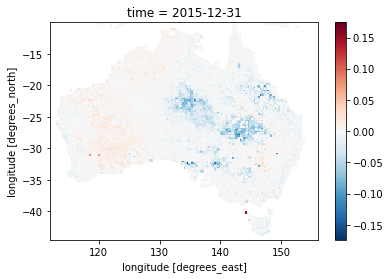

In [12]:
# ========== Make a dataset ==========
ds_out = xr.Dataset({
    var:ensmean,
    "FDRpvalsig":FDRpvsig,
    "IPCCsig": IPCCsig
})
# ===== add the attrs =====
ds_out.attrs = ds_ens.attrs
# This is where the history and should be updated
# This is where the result would also be saved to netcdf

print(ds_out)

(ds_out[var] * ds_out["FDRpvalsig"] * ds_out["IPCCsig"]).plot()
plt.show()

